# Data-driven Multimodal Alignment
Author: Ruchit Agrawal

This notebook demonstrates how time-series data pertaining to different modalities can be aligned using deep learning.

In [1]:
import os
import sys
import librosa
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist

In [2]:
plt.style.use('ggplot')

In [3]:
df = pd.read_csv('M06-1beat_time.csv')

In [4]:
### Data visualization
df

,Unnamed: 0,measure_number,beat_number,pid1263-01,pid52932-01,pid9048-01,pid9050-01,pid9054-01,pid9055-01,pid9058-01,...,pid9137-01,pid9138-01,pid9139-01,pid9150-15,pid9153-01,pid9166c-03,pid9173-06,pid9174-01,pid9186c-01,pid9192-01
0,0,1,2,4.435011,3.041814,3.877732,1.109002,3.181134,2.298027,3.552653,...,1.904036,0.589002,1.147007,1.149002,0.952018,0.786009,0.224014,0.269002,0.407007,0.529002
1,1,2,0,5.131610,3.970612,4.760091,1.648594,4.040272,3.268594,4.852971,...,2.623855,1.713129,1.928594,1.908594,1.728594,1.189944,1.188594,1.048594,0.789478,1.248594
2,2,2,1,5.893084,4.913084,5.553084,2.260771,4.513084,3.993084,5.673084,...,3.053084,2.433084,2.813084,2.533084,2.345215,1.573084,1.813084,1.633084,1.130771,2.153084
3,3,2,2,6.366145,5.446145,6.066145,2.586145,4.906145,4.406145,6.339048,...,3.406145,2.846145,3.286145,2.966145,2.716735,2.006145,2.206145,2.046145,1.425125,2.546145
4,4,3,0,7.010227,6.110227,6.670227,3.150227,5.410227,4.890227,7.230227,...,3.784853,3.410227,3.790227,3.490227,3.170227,2.370227,2.670227,2.550227,1.830227,3.170227
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
332,332,112,1,187.953900,176.553900,192.533900,172.453900,154.973900,179.353900,185.433900,...,125.333900,162.813900,189.851950,151.093900,153.053900,160.273900,188.253900,142.573900,126.693900,189.293900
333,333,112,2,188.894310,177.874310,193.254310,173.414310,156.214310,180.204770,186.294310,...,125.991470,164.074310,190.714310,151.614310,154.292150,161.086080,189.014310,143.152150,127.166080,190.112430
334,334,113,0,189.974970,179.649820,194.549820,174.569820,157.049820,181.609820,187.549820,...,126.869820,165.849820,191.803270,152.489820,155.709820,161.989820,190.289820,143.969820,128.133310,191.049820
335,335,113,1,190.924920,180.904920,195.504920,176.084920,158.184920,183.004920,189.144920,...,127.407890,167.324920,192.684920,153.824920,156.728730,162.764920,191.724920,145.041640,129.248730,192.104920


Text(0.5, 1.0, 'Variations of beats across different versions of M06-1')

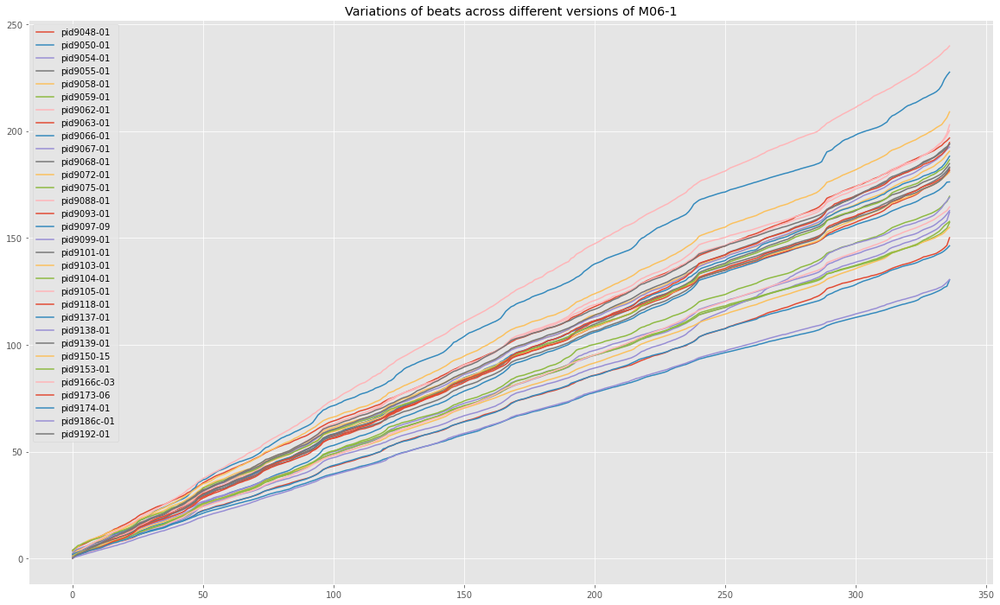

In [5]:
df[df.columns[5:]].plot(figsize=(20,12))
plt.title('Variations of beats across different versions of M06-1')

## Data generation
---
- `gen_data(folder, csv)`
    - **folder** : path containing files corresponding to a specific Mazurka
    - **csv** : path of the csv file for that Mazurka
    
    - **return** : euclidean distance matrix and aligned path values (extrapolated for each value of ) <br><br>
- `get_matrix(file1, file2)`
    - **file1** : location of the file to be presented on the x-axis of the distance matrix
    - **file2** : location of the file to be presented on the y-axis of the distance matrix
    - **return** : euclidean distance matrix

In [6]:
import numpy as np # linear algebra
import random
import pandas as pd # data processing
import matplotlib.pyplot as plt
from pandas import datetime
import math, time
import itertools
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

import datetime
from operator import itemgetter
from sklearn.metrics import mean_squared_error
from math import sqrt
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable

<ipython-input-6-fd8e901605d8>:5: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  from pandas import datetime


In [7]:
import warnings
warnings.filterwarnings('ignore')

In [8]:
import os
import sys
import librosa
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist
from scipy.interpolate import interp1d
from tqdm import tqdm

def get_matrix(file1, file2):
    file1 = file1 + '.mp4'
    file2 = file2 + '.mp4'
    fname = librosa.util.example_audio_file()

    y1, sr1 = librosa.load(file1)
    y2, sr2 = librosa.load(file2)
        
    flipped = False
    if y1.shape[0] < y2.shape[0]:
        flipped=True
        y1,y2 = y2, y1
        sr1, sr2 = sr2, sr1

    factor = y2.shape[0]/y1.shape[0]
#     print(factor)


    N = 4410   #2048  default value 
    H = 2205   #512   default value
    
    a1 = librosa.feature.chroma_stft(y = y1, sr = sr1, hop_length = H, n_fft = N)
    a2 = librosa.feature.chroma_stft(y = y2, sr = sr2, hop_length = int(H * factor), n_fft = N)  
   
    x1 = a1.T
    x2 = a2.T
        
    if x1.shape[0] > x2.shape[0]: 
        euc_dists = cdist(x2, x1, metric='euclidean')
    else:
        euc_dists = cdist(x1, x2, metric='euclidean')
        
    return euc_dists, factor, flipped


def gen_data(folder,csv):
    names = []
    
    for n in os.listdir(folder):
        if '.mp4' in n:
            names.append(n.replace(".mp4", ""))
            
    df = pd.read_csv(csv)
    c = 0
    
    for i in (range(len(df.columns[5:]))):
        for j in (range(i+1,len(df.columns[5:]))):
            if df.columns[5:][i] and df.columns[5:][j] in names:
                x,y = df[df.columns[5:][i]].values, df[df.columns[5:][j]].values
                euc_dists, factor, flipped = get_matrix(f'{folder}/{df.columns[5:][i]}', f'{folder}/{df.columns[5:][j]}')
                
                if not flipped:
                    x = np.round(x * 10, 4)
                    y = np.round(y * 10 * (1/factor), 4)
                else:
                    x = np.round(x * 10 * (1/factor), 4)
                    y = np.round(y * 10, 4)
                    
                    x, y = y, x
                
                f = interp1d(y, x, kind='slinear',fill_value="extrapolate")
                xnew = np.arange(0, euc_dists.shape[1],1)  #euc_dists.shape[1]
                ynew = f(xnew)
                
                yield euc_dists,ynew
            

### **Testing with one iteration over the data loader**

In [9]:
el = []
pl = []
i = 0
for e,p in tqdm(gen_data(folder='/media/shredpub/Elements/documents/datasets/Mazurkas/mazurka06-1', csv='M06-1beat_time.csv')):
    print('i',i, e.shape, p.shape)
    el.append(e)
    pl.append(p)
    i+=1
    if i == 10:
        break

1it [00:19, 19.21s/it]

i 0 (2034, 2034) (2034,)


2it [00:32, 15.84s/it]

i 1 (2034, 2034) (2034,)


3it [00:47, 15.37s/it]

i 2 (2034, 2035) (2035,)


4it [01:02, 15.27s/it]

i 3 (2034, 2035) (2035,)


5it [01:16, 14.80s/it]

i 4 (2034, 2035) (2035,)


6it [01:31, 14.87s/it]

i 5 (2100, 2100) (2100,)


7it [01:45, 14.55s/it]

i 6 (2034, 2034) (2034,)


8it [01:59, 14.49s/it]

i 7 (2034, 2034) (2034,)


9it [02:13, 14.12s/it]

i 8 (2034, 2034) (2034,)


9it [02:27, 16.37s/it]

i 9 (2034, 2035) (2035,)


### Plotting sample data

Text(0.5, 1.0, 'Euclidean distance matrix and aligned path')

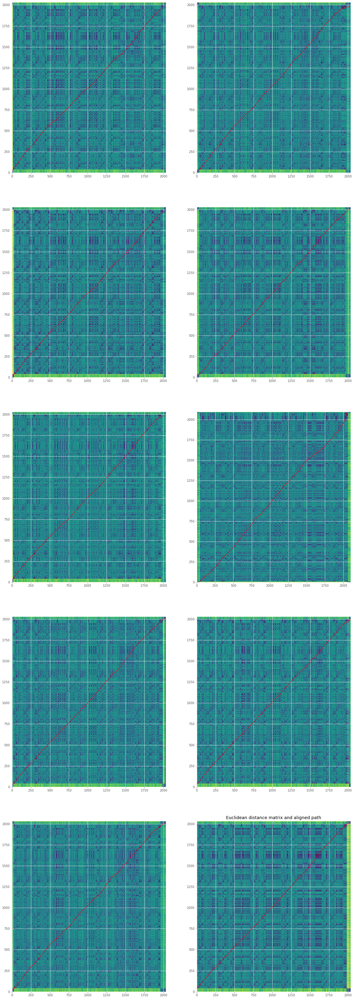

In [10]:
fig = plt.figure(figsize=(20, 60))
for i in range(10):
    ax = fig.add_subplot(5, 2, i+1)
    ax.plot(pl[i], 'r--')
    ax.imshow(el[i], interpolation='nearest', origin='lower', aspect='auto')
plt.title('Euclidean distance matrix and aligned path')

### Positional Encoding 

In [11]:
def get_pe(e):
    pe = torch.zeros((e.shape))
    columns = e.shape[1]
    if e.shape[1]%2 == 1:
        columns = e.shape[1]-1
    
    for col in range(0, columns, 2):
        pe[:, col] = math.sin(np.pi*(col /(e.shape[0])))/2
        pe[:, col + 1] = math.cos(np.pi*(col /(e.shape[0])))/2


    pe = pe.unsqueeze(0)
    pe = pe[0].detach().numpy()
    return pe

In [12]:
def norm_p(p,e):
    for x in range(len(p)):
        if p[x] > e.shape[0]:
            p[x] = e.shape[0]
    return p

In [13]:
train_dataX = np.array([])
train_dataY = np.array([])

lookback = 100
lookup = 100

no_of_notes = 5   # for all 1000000
counter = 0

for e,p in zip(el,pl):
    dataX = []
    dataY = []
    
    p = norm_p(p,e)
    padded = np.zeros((e.shape[1],e.shape[1]))
    padded[:e.shape[0],:e.shape[1]] = e
    e = padded
    pe = get_pe(e)
    e = np.add(e,pe)
    
    scaler1 = MinMaxScaler(feature_range=(-1, 1))
    scaler2 = MinMaxScaler(feature_range=(-1, 1))

    for i in range(e.shape[1] - lookback):
        dataX.append(np.transpose(e[i:i+lookup,i:i+lookback]))
    dataY = p[lookback:]

    # Normalization 
    dataX = np.array(dataX)
    dataY = np.array(dataY)
    
    dataX = scaler2.fit_transform(dataX.reshape(-1, dataX.shape[-1])).reshape(dataX.shape)  
    dataY = scaler1.fit_transform(dataY.reshape(-1, 1))
    
    counter+=1
    if no_of_notes < counter:
        break
        
    if counter > 1:
        train_dataX = np.append(train_dataX, dataX, 0)
        train_dataY = np.append(train_dataY, dataY, 0)
    else:
        train_dataX = dataX
        train_dataY = dataY


Text(0.5, 1.0, 'Positional encoding for distance matrix (max value:0.5, min value:-0.5)')

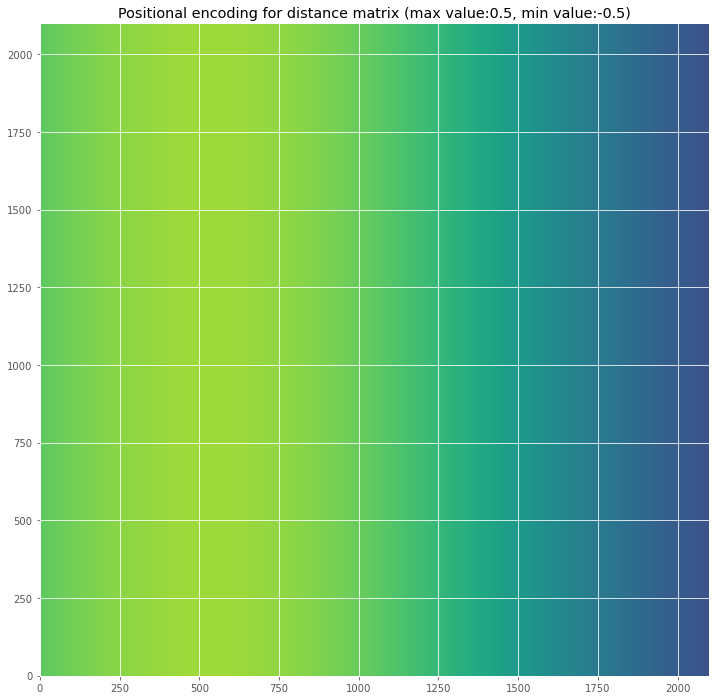

In [14]:
fig, ax = plt.subplots(figsize=(12,12))
plt.imshow(pe, aspect='auto', origin='lower')
plt.title('Positional encoding for distance matrix (max value:0.5, min value:-0.5)')
# plt.savefig('pe')

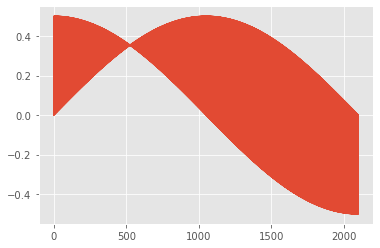

In [15]:
t = []
for x in range(pe.shape[0]):
    t.append(pe[x, x])

plt.plot(t) 

Text(0.5, 1.0, 'Distance matrix with positional encoding')

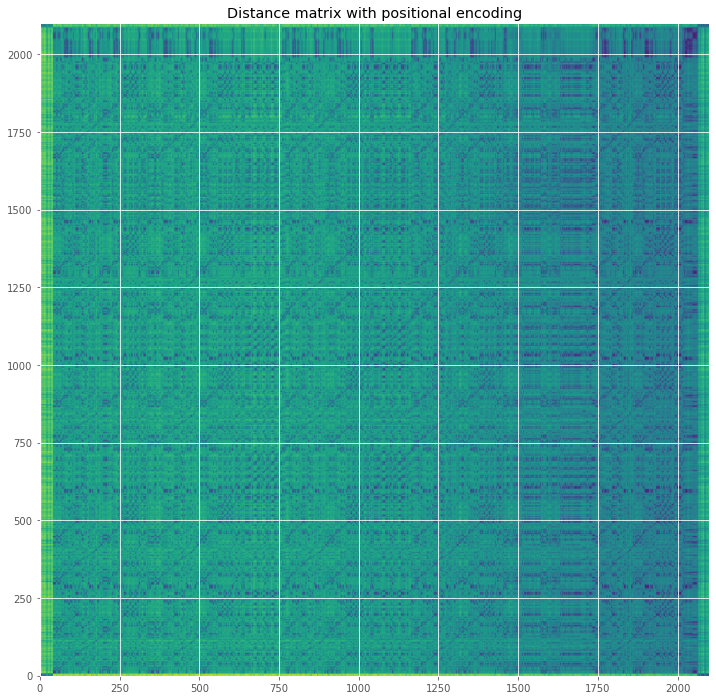

In [16]:
fig, ax = plt.subplots(figsize=(12, 12))
plt.imshow(e,aspect='auto', origin='lower')
plt.title('Distance matrix with positional encoding')
# plt.savefig('e+pe')

## Data loader

In [17]:
train_percent = 0.90                # train set percent
validate_percent = 0.05             # valiation set percent

train = int(train_percent * train_dataX.shape[0])
validation = int(validate_percent * train_dataX.shape[0]) + train

train_dataX = torch.from_numpy(train_dataX).type(torch.Tensor)
train_dataY = torch.from_numpy(train_dataY).type(torch.Tensor)

In [18]:
x_train, x_valid, x_test = train_dataX[0:train], train_dataX[train:validation], train_dataX[validation:]
y_train, y_valid, y_test = train_dataY[0:train], train_dataY[train:validation], train_dataY[validation:]

In [19]:
x_train.shape, x_valid.shape, x_test.shape, 

(torch.Size([8705, 100, 100]),
 torch.Size([483, 100, 100]),
 torch.Size([485, 100, 100]))

### train-validate-test data loaders

In [20]:
train = torch.utils.data.TensorDataset(x_train,y_train)

train_loader = torch.utils.data.DataLoader(dataset=train, 
                                           batch_size=32,
                                           shuffle=True)      #shuffle is important  

valid = torch.utils.data.TensorDataset(x_valid,y_valid)

valid_loader = torch.utils.data.DataLoader(dataset=valid, 
                                           batch_size=32,
                                           shuffle=False)     

test = torch.utils.data.TensorDataset(x_test,y_test)

test_loader = torch.utils.data.DataLoader(dataset=test, 
                                           batch_size=32,
                                           shuffle=False)  

## Pytorch model

### Hyper parameters

In [21]:
input_dim = dataX.shape[-1]
hidden_dim = 128
num_layers = 2
output_dim = 1
lr = 0.0005
epochs = 30

### LSTM model

In [22]:
class LSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_layers, output_dim):
        super(LSTM, self).__init__()
       
        self.hidden_dim = hidden_dim
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers, batch_first=True)
#         self.fc = nn.Linear(input_dim*hidden_dim, 128)       # for all layers into NN
        self.fc = nn.Linear(hidden_dim, 64)
        self.fc2 = nn.Linear(64, output_dim)
        

    def forward(self, x):
       
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_dim).requires_grad_()
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_dim).requires_grad_()

        out, (hn, cn) = self.lstm(x, (h0.detach(), c0.detach()))
#         out = out.reshape(out.shape[0],-1)      # for all layers into NN
        out = out[:,-1,:]                     # for last layer into NN
        
        out = F.relu(self.fc(out))
        out = self.fc2(out)

        return out
    
model = LSTM(input_dim=input_dim, hidden_dim=hidden_dim, output_dim=output_dim, num_layers=num_layers)

loss_fn = torch.nn.MSELoss()

optimiser = torch.optim.Adam(model.parameters(), lr=lr)

In [23]:
total_loss = []
for x in tqdm(range(epochs)):
    i = 0
    batch_loss = []
    for X,Y in (train_loader):
        optimiser.zero_grad()
        
        xin = X
        yin = Y

        # Forward pass
        y_train_pred = model(xin)
        loss = loss_fn(y_train_pred, yin)

        # Backward pass
        loss.backward()
        # Update parameters
        optimiser.step()
        i+=1
        batch_loss.append(float(loss.detach().numpy()))
        
    if x%2==0:
        pred = []
        real = []
        with torch.no_grad():
            for X,Y in (valid_loader):
                pre = model(X)
                pred.extend(pre[:,0])
                real.extend(Y[:,0])
                
        pred = np.array(pred)
        real = np.array(real)
        Score = math.sqrt(mean_squared_error(pred, real))
        batch_loss = np.array(batch_loss)
        total_loss.append(np.mean(batch_loss))
        print("Training loss: ", np.mean(batch_loss), "MSE validation:", Score) 

  3%|▎         | 1/30 [00:20<09:52, 20.45s/it]

Training loss:  0.07363038044764009 MSE validation: 0.11680385256181756


 10%|█         | 3/30 [01:02<09:23, 20.86s/it]

Training loss:  0.02713851256197107 MSE validation: 0.06331021814409545


 17%|█▋        | 5/30 [01:44<08:48, 21.13s/it]

Training loss:  0.013449860222453435 MSE validation: 0.05800648681333136


 23%|██▎       | 7/30 [02:28<08:15, 21.54s/it]

Training loss:  0.010015214213439615 MSE validation: 0.08600630769063759


 30%|███       | 9/30 [03:12<07:37, 21.80s/it]

Training loss:  0.005978626456203779 MSE validation: 0.10144480433022797


 37%|███▋      | 11/30 [03:57<07:00, 22.12s/it]

Training loss:  0.009047465947083106 MSE validation: 0.13300549285255148


 43%|████▎     | 13/30 [04:47<06:45, 23.83s/it]

Training loss:  0.001972438365855551 MSE validation: 0.06415099437102577


 50%|█████     | 15/30 [05:36<06:01, 24.10s/it]

Training loss:  0.0027058179295816266 MSE validation: 0.10823131256099505


 57%|█████▋    | 17/30 [06:22<05:05, 23.51s/it]

Training loss:  0.0011154577480808187 MSE validation: 0.07502584123976389


 63%|██████▎   | 19/30 [07:07<04:12, 22.95s/it]

Training loss:  0.002180854522700963 MSE validation: 0.05776340310428419


 70%|███████   | 21/30 [07:52<03:24, 22.68s/it]

Training loss:  0.001459369790589355 MSE validation: 0.07172561260500605


 77%|███████▋  | 23/30 [08:36<02:37, 22.47s/it]

Training loss:  0.000704753658769549 MSE validation: 0.08692417460990638


 83%|████████▎ | 25/30 [09:21<01:52, 22.51s/it]

Training loss:  0.010186329880458962 MSE validation: 0.06886824847749409


 90%|█████████ | 27/30 [10:03<01:05, 21.68s/it]

Training loss:  0.0026785133560247817 MSE validation: 0.06706450787699855


 97%|█████████▋| 29/30 [10:42<00:20, 20.65s/it]

Training loss:  0.0006376712148793335 MSE validation: 0.06494807087251048


100%|██████████| 30/30 [11:02<00:00, 22.07s/it]


In [24]:
stats = []
reals = []
predicteds = []

train_loader = torch.utils.data.DataLoader(dataset=train, 
                                           batch_size=32,
                                           shuffle=False)
with torch.no_grad():
    count = 0
    for X,Y in tqdm(train_loader):
        count+=1
        X_in = X
        # forward
        pre = model(X_in)
        predict = pre
        predicteds.extend(predict[:,0])
        reals.extend(Y[:,0])
        stats.extend(Y[:,0]-predict[:,0])

100%|██████████| 273/273 [00:06<00:00, 45.39it/s]


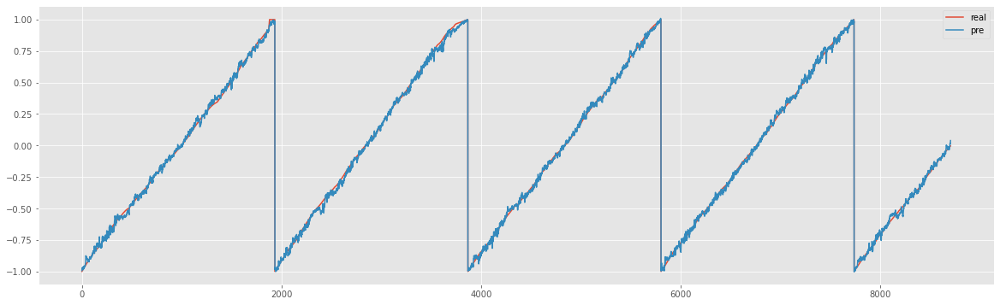

In [25]:
fig, ax = plt.subplots(figsize=(20,6))
plt.plot(reals, label='real')
plt.plot(predicteds, label='pre')
plt.legend()

### Testing

In [26]:
data = []
lookback = 100
lookup = 100

no_of_notes = 5   # for all 1000000
counter = 0

for e,p in zip(el,pl):
    dataX = []
    dataY = []
    
    if no_of_notes > counter:
        counter+=1
        continue
    
    p = norm_p(p,e)
    padded = np.zeros((e.shape[1], e.shape[1]))
    padded[:e.shape[0], :e.shape[1]] = e
    e = padded
    pe = get_pe(e)
    e = np.add(e, pe)

    for i in range(e.shape[1] - lookback):
        dataX.append(np.transpose(e[i:i+lookup, i:i+lookback]))
    dataY.extend(p[lookback:])
    
    dataX = np.array(dataX)
    dataY = np.array(dataY)
    data.append([dataX, dataY])
data = np.array(data)

In [27]:
data.shape

(5, 2)

(2035, 2035)


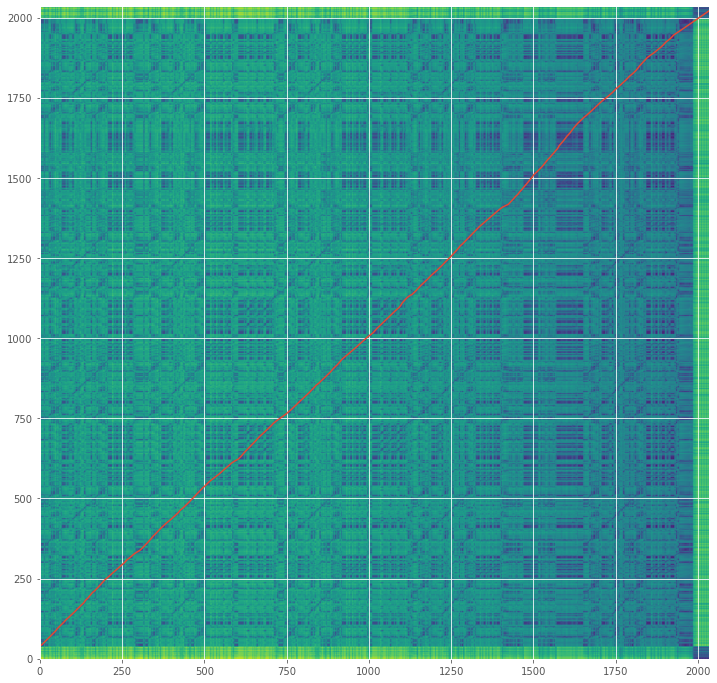

In [28]:
fig, ax = plt.subplots(figsize=(12,12))
print(e.shape)
plt.plot(p)
plt.imshow(e,aspect='auto', origin='lower')

100%|██████████| 61/61 [00:15<00:00,  4.04it/s]


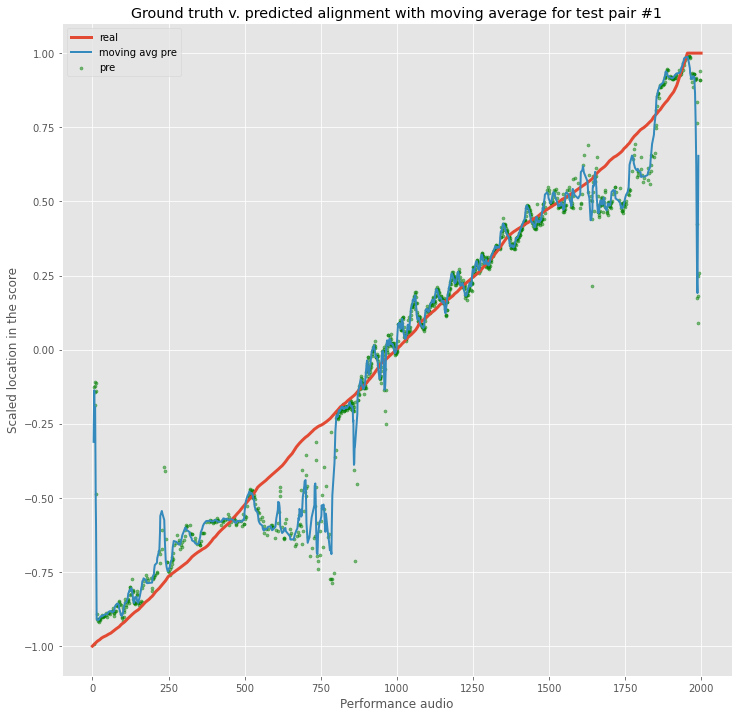

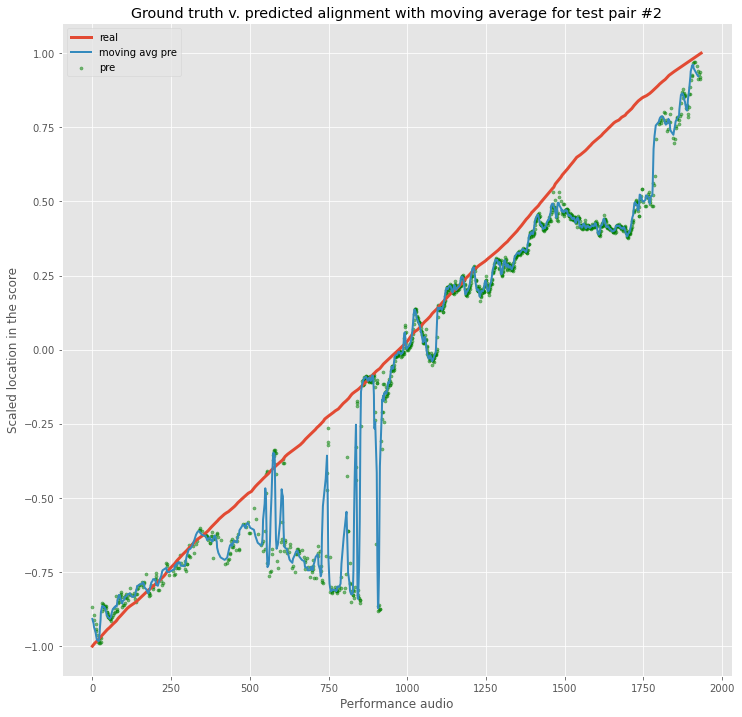

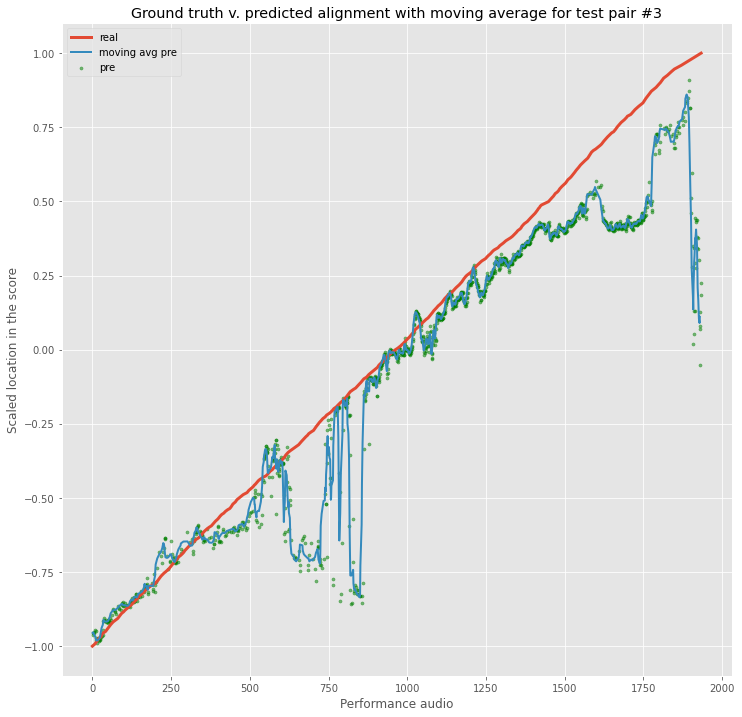

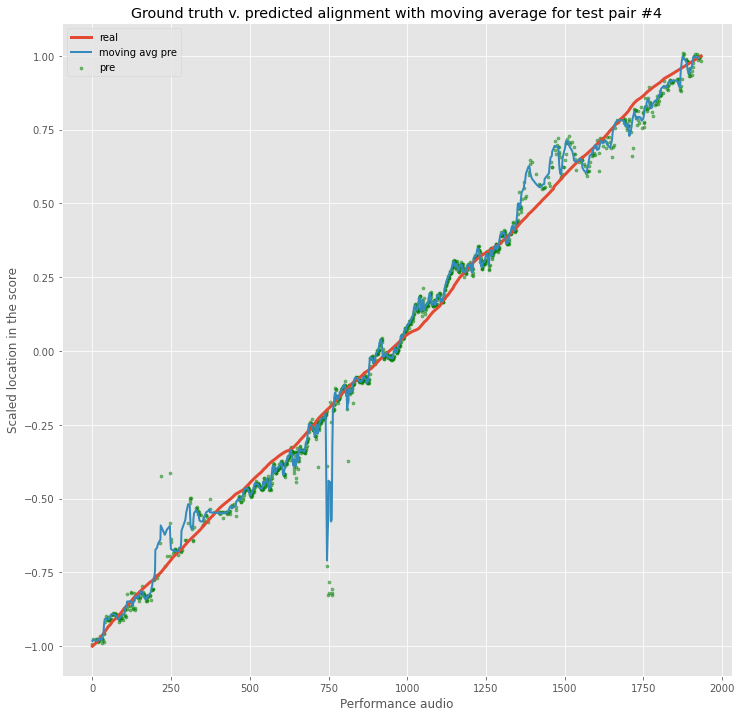

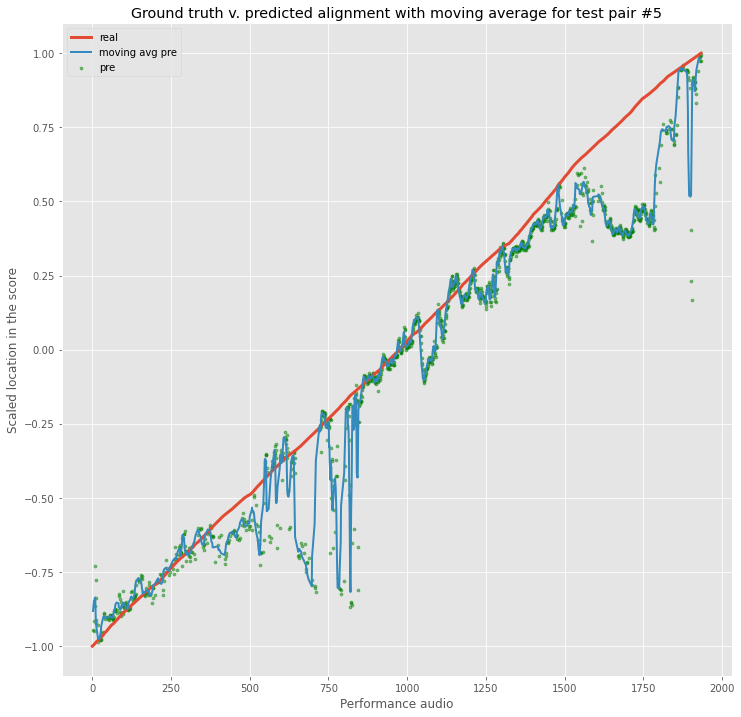

In [29]:
def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w

z = 1
threshold = 3e-8
for dataX, dataY in data:
    scaler = MinMaxScaler(feature_range=(-1, 1))
    scaler2 = MinMaxScaler(feature_range=(-1, 1))

    Y = scaler.fit_transform(dataY.reshape(-1, 1))
    dataX = scaler2.fit_transform(dataX.reshape(-1, dataX.shape[-1])).reshape(dataX.shape)

    X_train = torch.from_numpy(dataX).type(torch.Tensor)
    Y_train = torch.from_numpy(Y).type(torch.Tensor)

    train = torch.utils.data.TensorDataset(X_train, Y_train)
 
    train_next_loader = torch.utils.data.DataLoader(dataset=train, 
                                               batch_size=32,
                                               shuffle=False)      #shuffle is important  

    stats = []
    std = []
    
    reals = []
    predicteds = []

    with torch.no_grad():
        count = 0
        i = 0
        for X,Y in tqdm(train_next_loader):
            count+=1
            X_in = X
            # forward
            temp = []
            for _ in range(10):
                pre = model(X_in)
                pre = pre.reshape(-1)
                temp.append(pre.numpy())
                
            temp = np.array(temp)
                
            std.extend(np.std(temp,0))
            
            for s_error_i in range(X.shape[0]):
                
                if np.std(temp,0)[s_error_i] < threshold:
                    predicteds.append([s_error_i + i, np.mean(temp,0)[s_error_i]])
                    

            reals.extend(Y[:,0])
            i+=X.shape[0]
            
    predicteds = np.array(predicteds)
    fig, ax = plt.subplots(figsize=(12,12))
    plt.plot(reals,linewidth=3, label='real')
    plt.scatter(predicteds[:,0], predicteds[:,1], s=10, c='green', alpha=0.5, label='pre',)
    plt.plot(predicteds[:-4,0], moving_average(predicteds[:,1], 5), linewidth=2, label='moving avg pre')
    plt.title(f'Ground truth v. predicted alignment with moving average for test pair #{z}')
    plt.ylabel('Scaled location in the score')
    plt.xlabel('Performance audio')
    plt.legend()
    z+=1
    

In [30]:
# We used very limited data for training here. Training on more data will give better results.

In [31]:
# Stay tuned for further optimizations!